https://gadflyjl.org/stable/

In [1]:
# import Pkg; Pkg.add("Gadfly")
using Gadfly

┌ Info: Recompiling stale cache file /home/kyle/.julia/compiled/v1.1/Gadfly/DvECm.ji for Gadfly [c91e804a-d5a3-530f-b6f0-dfbca275c004]
└ @ Base loading.jl:1184


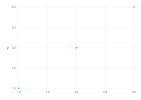

In [2]:
plot(y=[1,2,3])

# Tutorial

https://gadflyjl.org/stable/tutorial/#Tutorial-1

In [3]:
using RDatasets

┌ Info: Recompiling stale cache file /home/kyle/.julia/compiled/v1.1/RDatasets/JyIbx.ji for RDatasets [ce6b1742-4840-55fa-b093-852dadbb1d8b]
└ @ Base loading.jl:1184


In [4]:
iris = dataset("datasets", "iris")

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Categorical…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa
7,4.6,3.4,1.4,0.3,setosa
8,5.0,3.4,1.5,0.2,setosa
9,4.4,2.9,1.4,0.2,setosa


## DataFrames

In [5]:
p = plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point);  # keyword arguments in middle of positional arguments

┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = evalmapping(::DataFrame, ::Symbol) at dataframes.jl:96
└ @ Gadfly /home/kyle/.julia/packages/Gadfly/1wgcD/src/dataframes.jl:96


In [6]:
img = SVG("iris_plot.svg", 14cm, 8cm)
draw(img, p)  # saves to disk

false

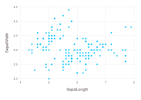

In [7]:
plot(iris, x=:SepalLength, y=:SepalWidth)

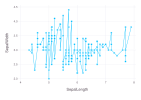

In [8]:
plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point, Geom.line)  # "colorless green ideas sleep furiously"

## Arrays

In [10]:
SepalLength = iris[:, :SepalLength];
SepalWidth = iris[:, :SepalWidth];

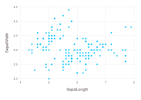

In [11]:
plot(x=SepalLength, y=SepalWidth, Geom.point, Guide.xlabel("SepalLength"), Guide.ylabel("SepalWidth"))

## Color

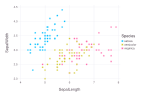

In [12]:
plot(iris, x=:SepalLength, y=:SepalWidth, color=:Species, Geom.point)

## Continuous Scales

In [13]:
set_default_plot_size(21cm, 8cm)
mammals = dataset("MASS", "mammals")

,Mammal,Body,Brain
,String,Float64,Float64
1,Arctic fox,3.385,44.5
2,Owl monkey,0.48,15.5
3,Mountain beaver,1.35,8.1
4,Cow,465.0,423.0
5,Grey wolf,36.33,119.5
6,Goat,27.66,115.0
7,Roe deer,14.83,98.2
8,Guinea pig,1.04,5.5
9,Verbet,4.19,58.0


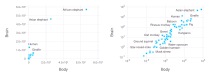

In [14]:
p1 = plot(mammals, x=:Body, y=:Brain, label=:Mammal, Geom.point, Geom.label)
p2 = plot(mammals, x=:Body, y=:Brain, label=:Mammal, Geom.point, Geom.label, Scale.x_log10, Scale.y_log10)
hstack(p1, p2)

In [15]:
using Printf

In [16]:
Diamonds = dataset("ggplot2", "diamonds")

,Carat,Cut,Color,Clarity,Depth,Table,Price,X
,Float64,Categorical…,Categorical…,Categorical…,Float64,Float64,Int32,Float64
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89
3,0.23,Good,E,VS1,56.9,65.0,327,4.05
4,0.29,Premium,I,VS2,62.4,58.0,334,4.2
5,0.31,Good,J,SI2,63.3,58.0,335,4.34
6,0.24,Very Good,J,VVS2,62.8,57.0,336,3.94
7,0.24,Very Good,I,VVS1,62.3,57.0,336,3.95
8,0.26,Very Good,H,SI1,61.9,55.0,337,4.07
9,0.22,Fair,E,VS2,65.1,61.0,337,3.87


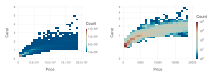

In [17]:
p3 = plot(
    Diamonds, x=:Price, y=:Carat, Geom.histogram2d(xbincount=25, ybincount=25), 
    Scale.x_continuous(format=:engineering)
)
p4 = plot(
    Diamonds, x=:Price, y=:Carat, Geom.histogram2d(xbincount=25, ybincount=25), 
    Scale.x_continuous(format=:plain),
    Scale.y_sqrt(labels=y->@sprintf("%i", y^2)),
    Scale.color_log10(minvalue=1.0, maxvalue=10^4),
    Guide.yticks(ticks=sqrt.(0:5))
)
hstack(p3, p4)

Scale transformations include `_sqrt`, `_log`, `_log2`, `_log10`, `_asinh`.

## Discrete Scales

In [18]:
mtcars = dataset("datasets", "mtcars")
labeldict = Dict(4 => "four", 6 => "six", 8 => "eight")

Dict{Int64,String} with 3 entries:
  4 => "four"
  8 => "eight"
  6 => "six"

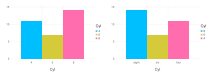

In [19]:
p5 = plot(
    mtcars, x=:Cyl, color=:Cyl, Geom.histogram,
    Scale.x_discrete(levels=[4,6,8]), Scale.color_discrete(levels=[4,6,8])
)
p6 = plot(
    mtcars, x=:Cyl, color=:Cyl, Geom.histogram,
    Scale.x_discrete(labels=i->labeldict[i], levels=[8,6,4]), Scale.color_discrete(levels=[8,6,4])
)
hstack(p5, p6)

## Gadfly Defaults

In [20]:
gasoline = dataset("Ecdat", "Gasoline")

,Country,Year,LGasPCar,LIncomeP,LrPMg,LCarPCap
,Categorical…,Int32,Float64,Float64,Float64,Float64
1,AUSTRIA,1960,4.17324,-6.47428,-0.334548,-9.76684
2,AUSTRIA,1961,4.10099,-6.42601,-0.351328,-9.60862
3,AUSTRIA,1962,4.07318,-6.40731,-0.379518,-9.45726
4,AUSTRIA,1963,4.05951,-6.37068,-0.414251,-9.34315
5,AUSTRIA,1964,4.03769,-6.32225,-0.445335,-9.23774
6,AUSTRIA,1965,4.03398,-6.29467,-0.497061,-9.1239
7,AUSTRIA,1966,4.04754,-6.25255,-0.466838,-9.01982
8,AUSTRIA,1967,4.05291,-6.23458,-0.505883,-8.9344
9,AUSTRIA,1968,4.04551,-6.20689,-0.522413,-8.84797


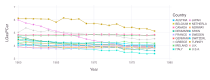

In [21]:
plot(gasoline, x=:Year, y=:LGasPCar, color=:Country, Geom.point, Geom.line)

## Rendering

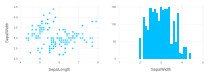

In [22]:
fig1a = plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point)
fig1b = plot(iris, x=:SepalWidth, Geom.bar)
fig1 = hstack(fig1a, fig1b)

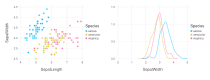

In [23]:
fig1a = plot(iris, x=:SepalLength, y=:SepalWidth, color=:Species, Geom.point)
fig1b = plot(iris, x=:SepalWidth, color=:Species, Geom.density)
fig1 = hstack(fig1a, fig1b)

# Plotting

### Functions and Expressions

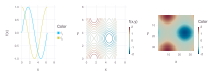

In [24]:
p1 = plot([sin,cos], 0, 2pi)
p2 = plot((x,y)->sin(x)+cos(y), 0, 2pi, 0, 2pi)
p3 = spy(ones(33)*sin.(0:(pi/16):2pi)' + cos.(0:(pi/16):2pi)*ones(33)')
hstack(p1, p2, p3)

### Wide-Formatted Data

In [26]:
births = RDatasets.dataset("HistData", "Arbuthnot")[:, [:Year, :Males, :Females]]

,Year,Males,Females
,Int64,Int64,Int64
1,1629,5218,4683
2,1630,4858,4457
3,1631,4422,4102
4,1632,4994,4590
5,1633,5158,4839
6,1634,5035,4820
7,1635,5106,4928
8,1636,4917,4605
9,1637,4703,4457


In [27]:
stack(births, [:Males, :Females])

,variable,value,Year
,Symbol,Int64,Int64
1,Males,5218,1629
2,Males,4858,1630
3,Males,4422,1631
4,Males,4994,1632
5,Males,5158,1633
6,Males,5035,1634
7,Males,5106,1635
8,Males,4917,1636
9,Males,4703,1637


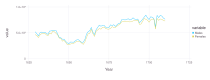

In [29]:
plot(stack(births, [:Males, :Females]), x=:Year, y=:value, color=:variable, Geom.line)

┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = meltdata(::DataFrame, ::Array{Gadfly.Col.GroupedColumn,1}) at dataframes.jl:40
└ @ Gadfly /home/kyle/.julia/packages/Gadfly/1wgcD/src/dataframes.jl:40
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = meltdata(::DataFrame, ::Array{Gadfly.Col.GroupedColumn,1}) at dataframes.jl:44
└ @ Gadfly /home/kyle/.julia/packages/Gadfly/1wgcD/src/dataframes.jl:44
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = meltdata(::DataFrame, ::Array{Gadfly.Col.GroupedColumn,1}) at dataframes.jl:45
└ @ Gadfly /home/kyle/.julia/packages/Gadfly/1wgcD/src/dataframes.jl:45
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = meltdata(::DataFrame, ::Array{Gadfly.Col.GroupedColumn,1}) at dataframes.jl:58


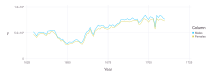

In [33]:
plot(
    births, x=:Year, y=Col.value(:Males, :Females),
    color=Col.index(:Males, :Females), Geom.line
)

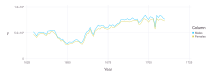

In [31]:
births_array = convert(Matrix{Int}, births)
plot(
    births_array, x=Col.value(1), y=Col.value(2:3...),
    color=Col.index(2:3...), Geom.line, Scale.color_discrete,
    Guide.colorkey(labels=["Males", "Females"]), Guide.xlabel("Year")
)

## Compositing

### Facets

┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = evalmapping at dataframes.jl:96 [inlined]
└ @ Core /home/kyle/.julia/packages/Gadfly/1wgcD/src/dataframes.jl:96


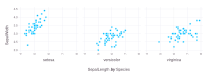

In [34]:
iris = dataset("datasets", "iris")
plot(iris, xgroup="Species", x="SepalLength", y="SepalWidth", Geom.subplot_grid(Geom.point))
# Geom.subplot_grid can do vertical or event 2D grid (think `pairs`)

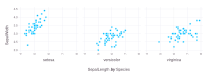

In [42]:
plot(iris, xgroup=:Species, x=:SepalLength, y=:SepalWidth, Geom.subplot_grid(Geom.point))

In [41]:
first(iris, 5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Categorical…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa


### Stacks

In [45]:
set_default_plot_size(21cm, 21cm)

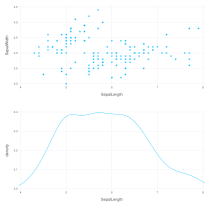

In [46]:
fig1a = plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point)
fig1b = plot(iris, x=:SepalLength, Geom.density, Guide.ylabel("density"), Coord.cartesian(xmin=4, xmax=8))
vstack(fig1a, fig1b)

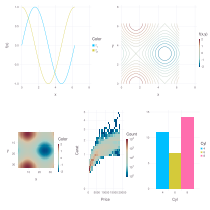

In [47]:
vstack(
    hstack(p1, p2),
    hstack(p3, p4, p5)
)

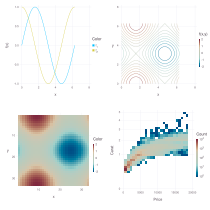

In [49]:
gridstack([p1 p2; p3 p4])

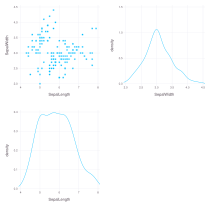

In [53]:
using Compose
fig1c = plot(iris, x=:SepalWidth, Geom.density, Guide.ylabel("density"), Coord.cartesian(xmin=2, xmax=4.5))
gridstack(Union{Plot,Compose.Context}[fig1a fig1c; fig1b Compose.context()])

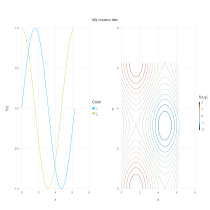

In [54]:
title(hstack(p1, p2), "My creative title")